# How to use Magicc climate data in python - KPMG ESG

#### While on my internship at KPMG in Hong Kong, I was tasked with making a notebook instructing my team how to access the Magicc database and use the data with python. This is the notebook I made. 

#### MAGICC/SCENGEN is a user-friendly software package that takes emissions scenarios for greenhouse gases, reactive gases, and sulfur dioxide as input and gives global-mean temperature, sea level rise, and regional climate as output. You can find more information about the magicc database at https://live.magicc.org/ 


Install necesseary packages, This may need IT approval (do this using guest wifi) :

In [1]:
from pprint import pprint
import pymagicc
from pymagicc import MAGICC6
from pymagicc.scenarios import MAGICCData, abspath, deepcopy, default_config, dirname, join, rcp, rcp26, rcp45, rcp60, rcp85, rcps, read_scen_file, zero_emissions
%matplotlib inline
import scmdata
from matplotlib import pyplot as plt
import pandas as pd
plt.style.use("ggplot")
plt.rcParams["figure.figsize"] = 16, 9
# press shift and enter

/opt/anaconda3/lib/python3.11/site-packages/scmdata/database/_database.py:9: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  import tqdm.autonotebook as tqdman


# Running Magicc in python

Use the code below to select the data you would like to use. you will be able to visualise and export the data later in the notebook.

In [2]:
results = []
for scen in rcps.groupby("scenario"):
    results_scen = pymagicc.run(scen, core_climatesensitivity=3)
    results.append(results_scen)

results = scmdata.run_append(results)

temperature_rel_to_1850_1900 = (
    results
    .filter(variable="Surface Temperature", region="World")
    .relative_to_ref_period_mean(year=range(1850, 1900 + 1))
)
# shift and enter

### How to use the code above
### Choose preloaded scenario

" for scen in rcps.groupby("scenario"): "

#### This part of the code from the section above allows you to plot data for a specific scenario within a dataset. To change the scenario to a different one, such as rcp26, you would need to replace the name of the DataFrame object in the loop. for example, if you wanted to use the rpc26 scenario, you would replace rcps with rcp26 in the loop declaration, like this:

" for scen in rcp26.groupby("scenario"): "

#### This will use the rcp26 DataFrame instead of the rcps DataFrame. You can substitute any other scenario DataFrame in place of rcp26 to plot data for that specific scenario.

The four RCP scenarios are already preloaded in Pymagicc. Find all the rpc scenarios at https://tntcat.iiasa.ac.at/RcpDb/dsd?Action=htmlpage&page=welcome. Execute the code below to find all the preloaded scenarios that uou can use in python;

In [3]:
available_objects = [obj for obj in dir(pymagicc.scenarios) if not obj.startswith('_')]

print(available_objects)
# shift and enter

['MAGICCData', 'abspath', 'deepcopy', 'default_config', 'dirname', 'join', 'rcp', 'rcp26', 'rcp45', 'rcp60', 'rcp85', 'rcps', 'read_scen_file', 'zero_emissions']


### Choose reigion and variable of dataset

" filter(variable="Surface Temperature", region="World") " 

#### This part of the code you used to plot the data allows you to filter a dataset based on the variable and region of interest. You can specify the variable of interest by replacing "Surface Temperature" with the name of the variable you want to use, and you can specify the region of interest by replacing "World" with the name of the region you want to analyze.

Execute the code below to find the different regions and variables you can choose from.

In [4]:
results.meta[["region"]].drop_duplicates()
# shift and enter

,region
0,World
1,World|Northern Hemisphere|Ocean
2,World|Northern Hemisphere|Land
3,World|Southern Hemisphere|Ocean
4,World|Southern Hemisphere|Land


In [5]:
results.meta[["variable"]].drop_duplicates()
# shift and enter

,variable
0,Atmospheric Concentrations|CH4
5,Atmospheric Concentrations|CO2
10,Emissions|BC|MAGICC Fossil and Industrial
15,Emissions|BC|MAGICC AFOLU
20,KYOTOGHGS_GWPEMIS
25,HEATUPTAKE_EBALANCE_TOTAL
30,Radiative Forcing
35,Surface Temperature
40,Emissions|CO2|MAGICC Fossil and Industrial
45,Emissions|CO2|MAGICC AFOLU


### Choose perameters of dataset

"results_scen = pymagicc.run(scen, core_climatesensitivity=3)"

#### This part of the code allows you change a perameter from the default perameters in magicc. You can specify the perameter of interest by replacing "core_climatesensitivity" with the name of the perameter you want to use, and you can specify what you would like to change the perameter to by changing the number "3" to an input of your choosing. The default parameters are the ones that were used to produce the RCP GHG concentrations (see also http://live.magicc.org/). to see the default list of perametrs and their inputs, exicute the code below. to change any peramteters, simply put a ", " after "core_climatesensitivity=3" and add the perameter from the list bewlow then "=" followed by your new imput within the brackets.

In [6]:
results.metadata["parameters"]
# press Shift and enter

{'years': {'startyear': 1765, 'endyear': 2100, 'stepsperyear': 12},
 'allcfgs': {'magiccversion': '6.8.01 BETA, 7th July 2012 - live.magicc.org',
  'pathname_infiles': '',
  'pathname_outfiles': '../out/',
  'path_staticcfg_frominfilepath': 1,
  'rundate': '2024-08-21 10:33',
  'runname': 'MAGICC6RCP_SingleRun_Template',
  'run_id': 1,
  'file_emissionscenario': 'SCENARIO.SCEN',
  'file_tuningmodel': 'PYMAGICC',
  'file_tuningmodel_2': '',
  'file_tuningmodel_3': '',
  'sector_include': 'NOSECTOR',
  'file_sector_emis': '',
  'bulkrunmodus': 'SINGLERUN',
  'co2_tempfeedback_switch': 1.0,
  'co2_feedbackfactor_gpp': 0.01070037,
  'co2_feedbackfactor_respiration': 0.06845893,
  'co2_feedbackfactor_detritus': -0.1357817,
  'co2_feedbackfactor_soil': 0.1540879,
  'co2_fertilization_factor': 0.6485981,
  'co2_fertilization_method': 1.100486,
  'co2_tempfeedback_yrstart': 1900,
  'co2_fertilization_yrstart': 1900,
  'co2_switchfromconc2emis_year': 2008,
  'oceancc_model': '3D-GFDL',
  'ocean

## How to export data as an excel file

The code below will show a dataframe of all the data.

In [7]:
df = pd.DataFrame(results.timeseries())
pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)
df
# shift and enter

time                                                                                                                                  1765-01-01  \
climate_model model   region                          scenario todo         unit          variable                                                 
MAGICC6       IMAGE   World                           RCP26    not_relevant ppb           Atmospheric Concentrations|CH4              721.894110   
                      World|Northern Hemisphere|Ocean RCP26    not_relevant ppb           Atmospheric Concentrations|CH4              721.894110   
                      World|Northern Hemisphere|Land  RCP26    not_relevant ppb           Atmospheric Concentrations|CH4              721.894110   
                      World|Southern Hemisphere|Ocean RCP26    not_relevant ppb           Atmospheric Concentrations|CH4              721.894110   
                      World|Southern Hemisphere|Land  RCP26    not_relevant ppb           Atmospheric Concentrations|CH4              721.894110   
                      World                           RCP26    not_relevant ppm           Atmospheric Concentrations|CO2              278.051580   
                      World|Northern Hemisphere|Ocean RCP26    not_relevant ppm           Atmospheric Concentrations|CO2              278.051580   
                      World|Northern Hemisphere|Land  RCP26    not_relevant ppm           Atmospheric Concentrations|CO2              278.051580   
                      World|Southern Hemisphere|Ocean RCP26    not_relevant ppm           Atmospheric Concentrations|CO2              278.051580   
                      World|Southern Hemisphere|Land  RCP26    not_relevant ppm           Atmospheric Concentrations|CO2              278.051580   
                      World                           RCP26    not_relevant Mt BC / yr    Emissions|BC|MAGICC Fossil and Industrial     0.000000   
                      World|Northern Hemisphere|Ocean RCP26    not_relevant Mt BC / yr    Emissions|BC|MAGICC Fossil and Industrial     0.000000   
                      World|Northern Hemisphere|Land  RCP26    not_relevant Mt BC / yr    Emissions|BC|MAGICC Fossil and Industrial     0.000000   
                      World|Southern Hemisphere|Ocean RCP26    not_relevant Mt BC / yr    Emissions|BC|MAGICC Fossil and Industrial     0.000000   
                      World|Southern Hemisphere|Land  RCP26    not_relevant Mt BC / yr    Emissions|BC|MAGICC Fossil and Industrial     0.000000   
                      World                           RCP26    not_relevant Mt BC / yr    Emissions|BC|MAGICC AFOLU                     0.000000   
                      World|Northern Hemisphere|Ocean RCP26    not_relevant Mt BC / yr    Emissions|BC|MAGICC AFOLU                     0.000000   
                      World|Northern Hemisphere|Land  RCP26    not_relevant Mt BC / yr    Emissions|BC|MAGICC AFOLU                     0.000000   
                      World|Southern Hemisphere|Ocean RCP26    not_relevant Mt BC / yr    Emissions|BC|MAGICC AFOLU                     0.000000   
                      World|Southern Hemisphere|Land  RCP26    not_relevant Mt BC / yr    Emissions|BC|MAGICC AFOLU                     0.000000   
                      World                           RCP26    not_relevant Gt CO2eq / yr KYOTOGHGS_GWPEMIS                             0.011070   
                      World|Northern Hemisphere|Ocean RCP26    not_relevant Gt CO2eq / yr KYOTOGHGS_GWPEMIS                             0.000000   
                      World|Northern Hemisphere|Land  RCP26    not_relevant Gt CO2eq / yr KYOTOGHGS_GWPEMIS                             0.009959   
                      World|Southern Hemisphere|Ocean RCP26    not_relevant Gt CO2eq / yr KYOTOGHGS_GWPEMIS                             0.000000   
                      World|Southern Hemisphere|Land  RCP26    not_relevant Gt CO2eq / yr KYOTOGHGS_GWPEMIS                             0.001111   
    

Use the code below to export the dataframe as an excel file to your desktop

Change YOURKPMGUSERNAME to your KPMG username.

In [ ]:
df.to_excel('Data.xlsx', index=True)
# shift and enter

## How to visualise the dataset

You can visualise the data by executing the code below. Change the title and Y axis label by changing the wording within the "quotes" 

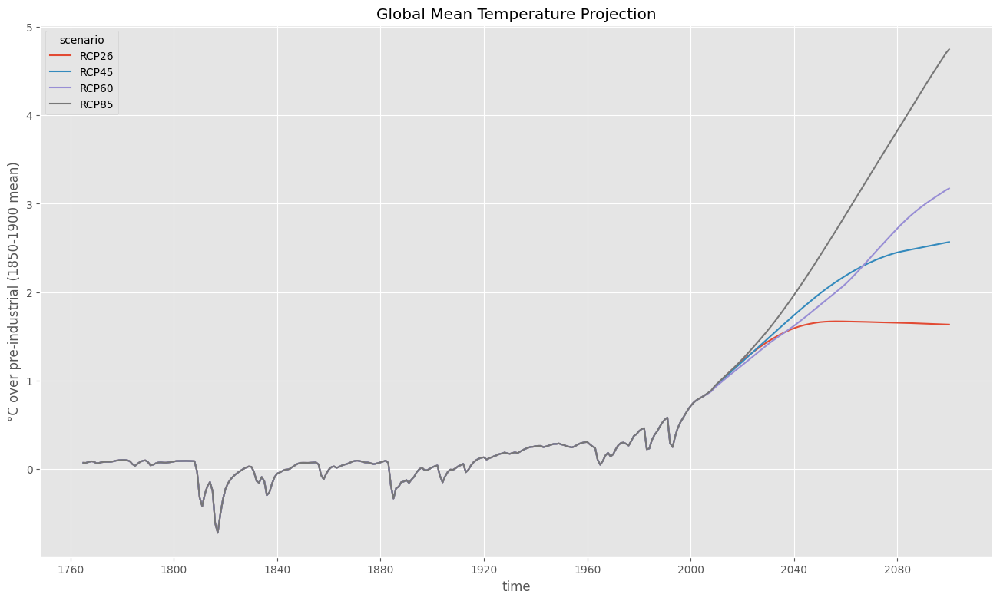

In [32]:
temperature_rel_to_1850_1900.lineplot()
plt.title("Global Mean Temperature Projection")
plt.ylabel("°C over pre-industrial (1850-1900 mean)");
plt.show()
# shift and enter

The code above plots the predicted global temerature increase relative to the mean global temperature between 1850-1900.

To save this graph execute the code below, Change YOURKPMGUSERNAME to your KPMG username.

In [28]:
plt.savefig('my_temperature_projection.pdf')
# press Shift and enter

### Visualising different peramiters in the same graph

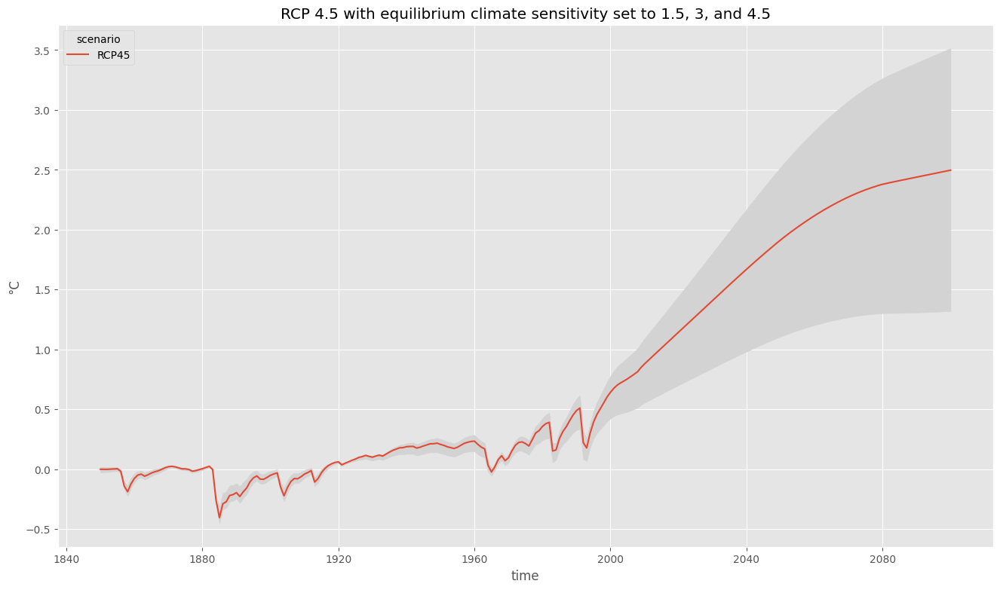

In [33]:
low = pymagicc.run(rcp45, core_climatesensitivity=1.5)
default = pymagicc.run(rcp45, core_climatesensitivity=3)
high = pymagicc.run(rcp45, core_climatesensitivity=4.5)

filtering = {
    "variable": "Surface Temperature",
    "region": "World",
    "year": range(1850, 2101),
}

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(16, 9))
default.filter(**filtering).line_plot(x="time", ax=ax)
plt.fill_between(
    low.filter(**filtering)["time"].values,
    low.filter(**filtering).timeseries().values.squeeze(),
    high.filter(**filtering).timeseries().values.squeeze(),
    color="lightgray",
)

plt.title(
    "RCP 4.5 with equilibrium climate sensitivity set to 1.5, 3, and 4.5"
)
plt.ylabel("°C");
plt.show()
# press Shift and enter



"low = pymagicc.run(rcp45, core_climatesensitivity=1.5)
default = pymagicc.run(rcp45, core_climatesensitivity=3)
high = pymagicc.run(rcp45, core_climatesensitivity=4.5)"

#### Choose wich scenario and variables you will like with this part of the code. "default = ..." will plot the orange line, this is meant to be the standard prjection. "high = ..." and "low = ... " should be used to show conservative and extreme projections.


"filtering = {
    "variable": "Surface Temperature",
    "region": "World",
    "year": range(1850, 2101),
} "

#### Change the variables in this section the same way as the last graph using the same variables as the last graph

plt.title(
    "RCP 4.5 with equilibrium climate sensitivity set to 1.5, 3, and 4.5"
)
plt.ylabel("°C");

#### Change the title and Y axis label by changing the wording within "" within this part of the code.

#### To save the graph to your desktop, execute the code below.

In [30]:
plt.savefig('my_figure.pdf')
# press Shift and enter

# Using preloaded magicc scenarios data

In [11]:
type(rcp45)
# shift and enter

<class 'pymagicc.io.MAGICCData'>

Use the code aboce to check your preloaded scenario exists. its should say "<class 'pymagicc.io.MAGICCData'>"

### exporting preloaded scenarios data as an excel file

Use the code below to show the data as a dataframe

In [9]:
dt = pd.DataFrame(rcp45.timeseries())
pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)
dt
# shift and enter

time                                                                                                           2000-01-01 00:00:00  \
climate_model model   region        scenario todo unit             variable                                                          
unspecified   MiniCAM World|Bunkers RCP45    SET  Gt C / yr        Emissions|CO2|MAGICC Fossil and Industrial               0.0000   
                                                                   Emissions|CO2|MAGICC AFOLU                               0.0000   
                                                  Mt CH4 / yr      Emissions|CH4                                            0.4325   
                                                  Mt N2ON / yr     Emissions|N2O                                            0.0000   
                                                  Mt S / yr        Emissions|SOx                                            5.5390   
                                                  Mt CO / yr       Emissions|CO                                             1.1854   
                                                  Mt NMVOC / yr    Emissions|NMVOC                                          2.9270   
                                                  Mt N / yr        Emissions|NOx                                            6.2818   
                                                  Mt BC / yr       Emissions|BC                                             0.1361   
                                                  Mt OC / yr       Emissions|OC                                             0.1395   
                                                  Mt N / yr        Emissions|NH3                                            0.0000   
                                                  kt CF4 / yr      Emissions|CF4                                            0.0000   
                                                  kt C2F6 / yr     Emissions|C2F6                                           0.0000   
                                                  kt C6F14 / yr    Emissions|C6F14                                          0.0000   
                                                  kt HFC23 / yr    Emissions|HFC23                                          0.0000   
                                                  kt HFC32 / yr    Emissions|HFC32                                          0.0000   
                                                  kt HFC4310 / yr  Emissions|HFC4310                                        0.0000   
                                                  kt HFC125 / yr   Emissions|HFC125                                         0.0000   
                                                  kt HFC134a / yr  Emissions|HFC134a                                        0.0000   
                                                  kt HFC143a / yr  Emissions|HFC143a                                        0.0000   
                                                  kt HFC227ea / yr Emissions|HFC227ea                                       0.0000   
                                                  kt HFC245fa / yr Emissions|HFC245fa                                       0.0000   
                                                  kt SF6 / yr      Emissions|SF6                                            0.0000   
                      World|R5LAM   RCP45    SET  Gt C / yr        Emissions|CO2|MAGICC Fossil and Industrial               0.3710   
                                                                   Emissions|CO2|MAGICC AFOLU                               0.3649   
                                                  Mt CH4 / yr      Emissions|CH4                                           40.0656   
                                                  Mt N2ON / yr     Emissions|N2O                                            1.0448   
                                                  Mt S / yr        Emissions|SOx                                  

Once in a dataframe, you can export the data above as an excel file onto your desktop using the code below.

Change YOURKPMGUSERNAME to your kpmg username

In [ ]:
dt.to_excel('Data.xlsx', index=True)
# shift and enter

##  Visualising preloaded datasets

### The rcp's contain the following emissions with the following units

In [11]:
rcp45.meta[["variable", "unit"]].drop_duplicates()
# press Shift and enter

,variable,unit
161,Emissions|CO2|MAGICC Fossil and Industrial,Gt C / yr
162,Emissions|CO2|MAGICC AFOLU,Gt C / yr
163,Emissions|CH4,Mt CH4 / yr
164,Emissions|N2O,Mt N2ON / yr
165,Emissions|SOx,Mt S / yr
166,Emissions|CO,Mt CO / yr
167,Emissions|NMVOC,Mt NMVOC / yr
168,Emissions|NOx,Mt N / yr
169,Emissions|BC,Mt BC / yr
170,Emissions|OC,Mt OC / yr


### The rcp's contain the following reigions

In [12]:
rcp45["region"].unique()
# press Shift and enter

array(['World|Bunkers', 'World|R5LAM', 'World|R5MAF', 'World|R5ASIA',
       'World|R5REF', 'World|R5OECD', 'World'], dtype=object)

### Use the code below to visualise different scenarios

Fossil fuel emissions for the four RCP scenarios.

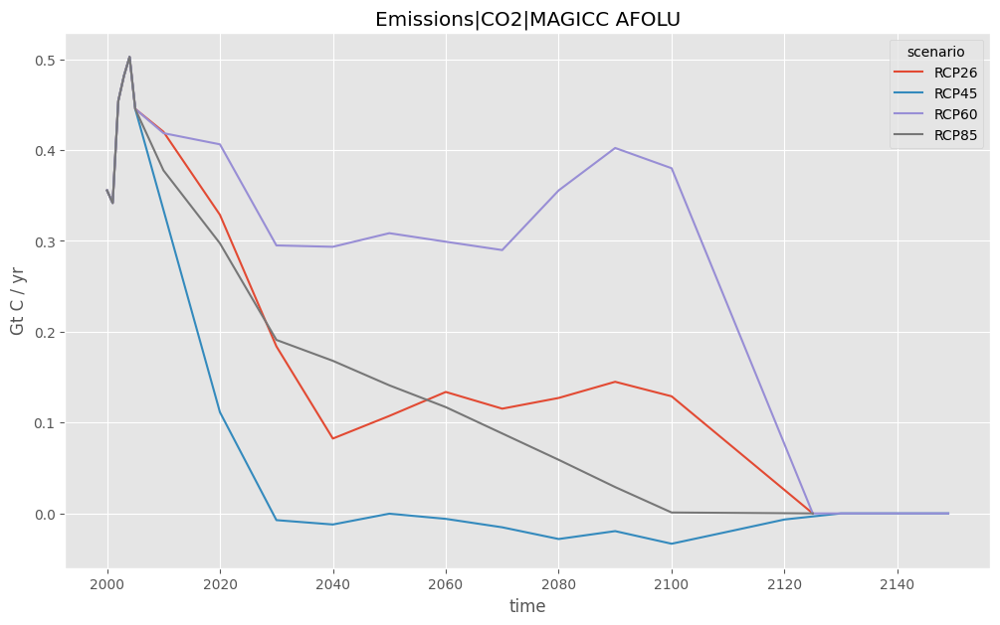

In [25]:
import matplotlib.pyplot as plt

# Assuming `rcps` is already defined and imported properly
dx = rcps.filter(variable="Emissions|CO2|MAGICC AFOLU", region="World|R5ASIA")
dx = dx.filter(year=range(2000, 2150))

plt.figure(figsize=(12, 7))
dx.lineplot(x="time").set_title(dx.get_unique_meta("variable", True))

plt.show()
# press Shift and enter

"dx = rcps.filter(variable="Emissions|CO2|MAGICC AFOLU", region="World|R5ASIA")
dx = dx.filter(year=range(2000, 2150)) "

#### This part of the code you used to plot the data allows you to filter a dataset based on the variable and region of interest. You can specify the variable of interest by replacing "Emissions|CO2|MAGICC AFOLU" with the name of the variable you want to use, and you can specify the region of interest by replacing "World|R5ASIA" with the name of the region you want to analyze. You can change the time by changing the numbers "2000, 2150"

to save this graph to your desktop, execute the code below. Change YOURKPMGUSERNAME to your KPMG username.

In [19]:
plt.savefig('my_emissions_projection.pdf')
# press Shift and enter

### visualising different regions

Fossil fuel emissions for different regions.

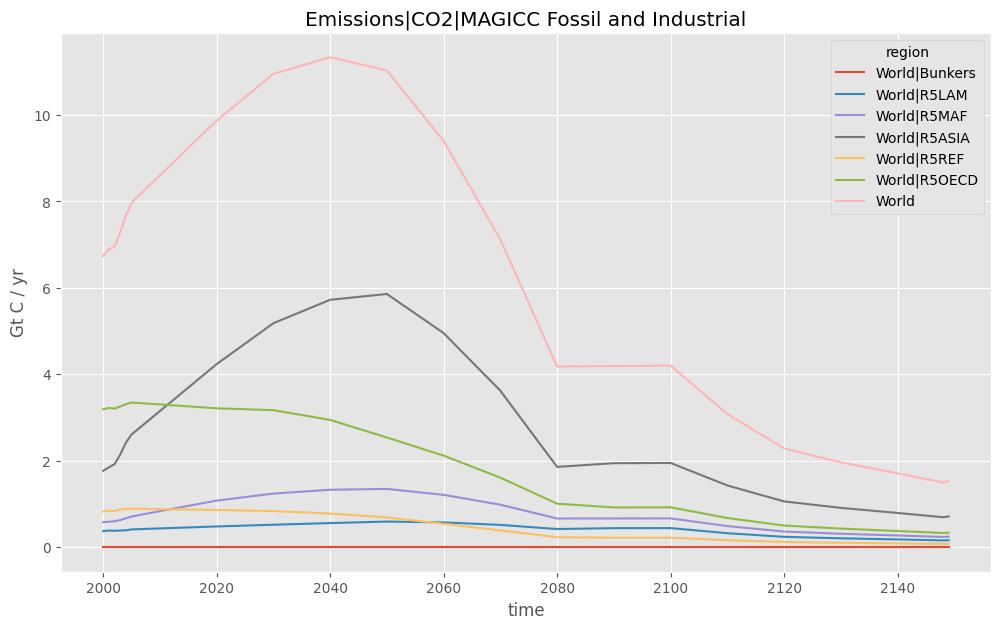

In [26]:
import matplotlib.pyplot as plt

categories_to_plot = [
    "Emissions|" + v
    for v in ["CO2|MAGICC Fossil and Industrial"]
]

for g in rcp45.filter(variable=categories_to_plot, year=range(2000, 2150)).groupby("variable"):
    plt.figure(figsize=(12, 7))
    g.lineplot(hue="region").set_title(g.get_unique_meta("variable", True))

    plt.show()
# press Shift and enter

" categories_to_plot = [

    "Emissions|" + v
    for v in [ "CO2|MAGICC Fossil and Industrial" ]
    
   
for g in rcp45.filter(

    variable=categories_to_plot, year=range(2000, 2150) "

#### This part of the code you used to plot the data allows you to filter a dataset based on the variable and region of interest. You can specify the variable of interest by replacing "CO2|MAGICC Fossil and Industrial" with the name of the variable you want to use. please be careful not include the "Emissions|" part of the variable, as that is already included. You can change the time by changing the numbers in "year=range(2000, 2150)"

To save the graph above, execute the code below. Change YOURKPMGUSERNAME to your KPMG username.

In [21]:
plt.savefig('my_emissions_projection_{i}.pdf')
# press Shift and enter